In [2]:
pip install basemap

     |████████████████████████████████| 862 kB 4.2 MB/s 
     |████████████████████████████████| 30.5 MB 66.8 MB/s 
     |████████████████████████████████| 6.3 MB 31.6 MB/s 
     |████████████████████████████████| 219 kB 48.1 MB/s 
  Created wheel for pyshp: filename=pyshp-2.1.3-py3-none-any.whl size=37324 sha256=59b354762847eede6dbc57ae995451a0d2a0ccddc20668b01a5cb2e7b624d936
  Stored in directory: /root/.cache/pip/wheels/43/f8/87/53c8cd41545ba20e536ea29a8fcb5431b5f477ca50d5dffbbe
Successfully built pyshp


In [33]:
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Polygon
import shapefile
%matplotlib inline

import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

In [38]:
paris = pd.read_csv('Paris_Data_NotScaled.csv', index_col=0)
athens = pd.read_csv('Athens_Data_NotScaled.csv', index_col=0)
beijing = pd.read_csv('Beijing_Data_NotScaled.csv', index_col=0)
delhi = pd.read_csv('Delhi_Data_NotScaled.csv', index_col=0)

paris.index = pd.to_datetime(paris.index)
athens.index = pd.to_datetime(athens.index)
beijing.index = pd.to_datetime(beijing.index)
delhi.index = pd.to_datetime(delhi.index)

paris = paris.resample("1m").mean().bfill()
athens = athens.resample("1m").mean().bfill()
beijing = beijing.resample("1m").mean().bfill()
delhi = delhi.resample("1m").mean().bfill()

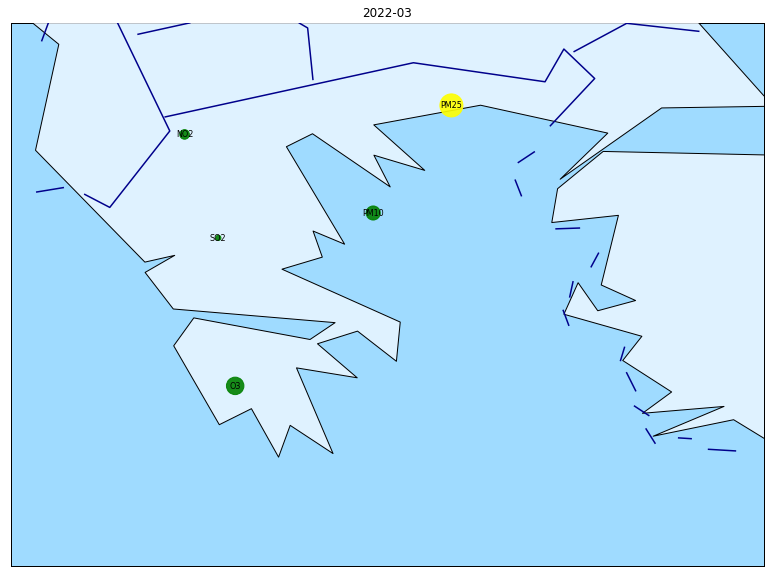

In [45]:
fig = plt.figure(figsize=(20,10))
#map = Basemap(projection='kav7',lon_0=0,lat_0=0,resolution='l')
map = Basemap(llcrnrlon=18.962745 ,llcrnrlat=34.953520,urcrnrlon=28.863195,urcrnrlat=42.096198,projection='cyl')
map.drawcoastlines()
map.drawmapboundary(fill_color='#9fdbff',zorder=1)
map.fillcontinents(color='#f0f8ff',lake_color='#9fdbff',alpha=0.8,zorder=1.5)
map.drawcountries(linewidth=1.5, color='darkblue')
map.drawstates()
ax = plt.gca()

sizesAthens = athens.iloc[0,0:5]*10
colorsAthens = athens.iloc[0,0:5]

cmap, norm = mpl.colors.from_levels_and_colors([0,50,100,150,200,300,500], ['green','yellow','orange','red','purple','maroon'])
m = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
plt.title(athens.index[0].strftime('%Y-%m'))
# Athens
x1,y1=map(21.247312, 40.628173)
x2,y2=map(21.912230, 37.324126)
x3,y3=map(23.725641, 39.595757)
x4,y4=map(24.753241, 41.009381)
x5,y5=map(21.690591, 39.268943)
scatter1 = map.scatter(np.array([x1,x2,x3,x4,x5]),np.array([y1,y2,y3,y4,y5]),s=sizesAthens,c=colorsAthens,cmap=cmap,norm=norm,alpha=0.9,edgecolors='face',zorder=3, latlon=True)
x=[x1,x2,x3,x4,x5]
y=[y1,y2,y3,y4,y5]
labels=['NO2','O3','PM10','PM25','SO2']
for i, txt in enumerate(labels):
    ax.annotate(labels[i],(x[i],y[i]),size=8,va='center',ha='center')

def update(i):
    scatter1.set_sizes(athens.iloc[i,0:5]*10)
    scatter1.set_color(m.to_rgba(athens.iloc[i, 0:5]))
    plt.title(athens.index[i].strftime('%Y-%m'))
    return scatter1, 

anim = FuncAnimation(plt.gcf(),update,interval=200,blit=True,repeat=True,frames=len(athens))

anim

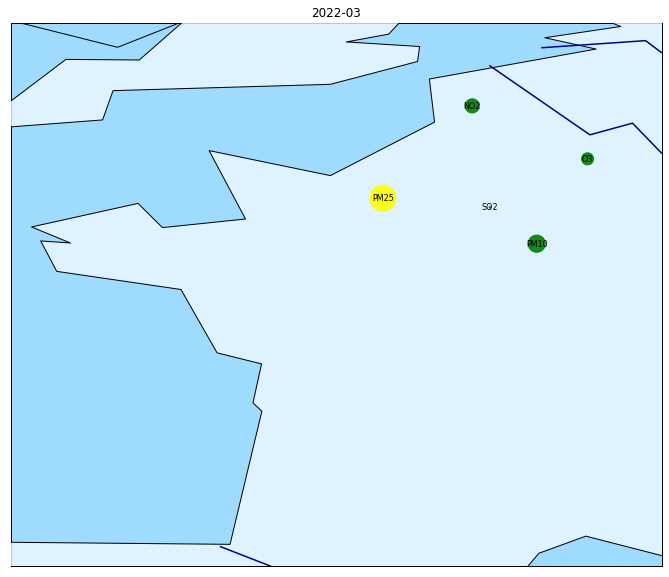

In [43]:
fig = plt.figure(figsize=(20,10))
#map = Basemap(projection='kav7',lon_0=0,lat_0=0,resolution='l')
map = Basemap(llcrnrlon=-5.113373 ,llcrnrlat=43.078939,urcrnrlon=5.304030,urcrnrlat=51.773708,projection='cyl')
map.drawcoastlines()
map.drawmapboundary(fill_color='#9fdbff',zorder=1)
map.fillcontinents(color='#f0f8ff',lake_color='#9fdbff',alpha=0.8,zorder=1.5)
map.drawcountries(linewidth=1.5, color='darkblue')
map.drawstates()
ax = plt.gca()

sizesParis = paris.iloc[0,0:5]*10
colorsParis = paris.iloc[0,0:5]

cmap, norm = mpl.colors.from_levels_and_colors([0,50,100,150,200,300,500], ['green','yellow','orange','red','purple','maroon'])
m = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
plt.title(paris.index[0].strftime('%Y-%m'))

#Paris
x1,y1=map(2.268034, 50.443359)
x2,y2=map(4.113737, 49.596314)
x3,y3=map(3.300749, 48.239148)
x4,y4=map(0.839811, 48.965636)
x5,y5=map(2.553678, 48.821174)
scatter1 = map.scatter(np.array([x1,x2,x3,x4,x5]),np.array([y1,y2,y3,y4,y5]),s=sizesParis,c=colorsParis,cmap=cmap,norm=norm,alpha=0.9,edgecolors='face',zorder=3, latlon=True)
x=[x1,x2,x3,x4,x5]
y=[y1,y2,y3,y4,y5]
labels=['NO2','O3','PM10','PM25','SO2']
for i, txt in enumerate(labels):
    ax.annotate(labels[i],(x[i],y[i]),size=8,va='center',ha='center')

def update(i):
    scatter1.set_sizes(paris.iloc[i,0:5]*10)
    scatter1.set_color(m.to_rgba(paris.iloc[i, 0:5]))
    plt.title(paris.index[i].strftime('%Y-%m'))
    return scatter1, 

anim = FuncAnimation(plt.gcf(),update,interval=200,blit=True,repeat=True,frames=len(paris))

anim

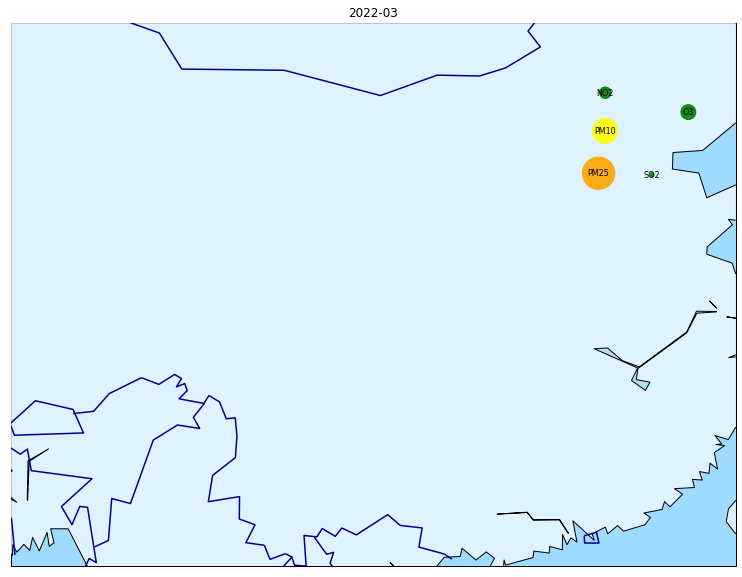

In [42]:
fig = plt.figure(figsize=(20,10))
#map = Basemap(projection='kav7',lon_0=0,lat_0=0,resolution='l')
map = Basemap(llcrnrlon=88.951608 ,llcrnrlat=21.134170,urcrnrlon=120.444015,urcrnrlat=44.745030,projection='cyl')
map.drawcoastlines()
map.drawmapboundary(fill_color='#9fdbff',zorder=1)
map.fillcontinents(color='#f0f8ff',lake_color='#9fdbff',alpha=0.8,zorder=1.5)
map.drawcountries(linewidth=1.5, color='darkblue')
map.drawstates()
ax = plt.gca()

sizesBeijing = beijing.iloc[0,0:5]*10
colorsBeijing = beijing.iloc[0,0:5]

cmap, norm = mpl.colors.from_levels_and_colors([0,50,100,150,200,300,500], ['green','yellow','orange','red','purple','maroon'])
m = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
plt.title(beijing.index[0].strftime('%Y-%m'))

#Beijing
x1,y1=map(114.776597, 41.702095)
x2,y2=map(118.385257, 40.860510)
x3,y3=map(114.776597, 40.039859)
x4,y4=map(114.486245, 38.205833)
x5,y5=map(116.809060, 38.140616)
scatter1 = map.scatter(np.array([x1,x2,x3,x4,x5]),np.array([y1,y2,y3,y4,y5]),s=sizesBeijing,c=colorsBeijing,cmap=cmap,norm=norm,alpha=0.9,edgecolors='face',zorder=3, latlon=True)
x=[x1,x2,x3,x4,x5]
y=[y1,y2,y3,y4,y5]
labels=['NO2','O3','PM10','PM25','SO2']
for i, txt in enumerate(labels):
    ax.annotate(labels[i],(x[i],y[i]),size=8,va='center',ha='center')

def update(i):
    scatter1.set_sizes(beijing.iloc[i,0:5]*10)
    scatter1.set_color(m.to_rgba(beijing.iloc[i, 0:5]))
    plt.title(beijing.index[i].strftime('%Y-%m'))
    return scatter1, 

anim = FuncAnimation(plt.gcf(),update,interval=200,blit=True,repeat=True,frames=len(beijing))

anim

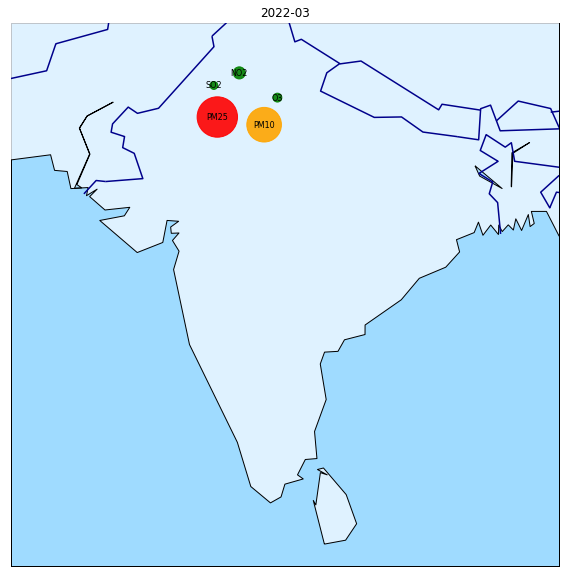

In [54]:
fig = plt.figure(figsize=(20,10))
#map = Basemap(projection='kav7',lon_0=0,lat_0=0,resolution='l')
map = Basemap(llcrnrlon=64.446235 ,llcrnrlat=4.877979,urcrnrlon=92.088259,urcrnrlat=32.274133,projection='cyl')
map.drawcoastlines()
map.drawmapboundary(fill_color='#9fdbff',zorder=1)
map.fillcontinents(color='#f0f8ff',lake_color='#9fdbff',alpha=0.8,zorder=1.5)
map.drawcountries(linewidth=1.5, color='darkblue')
map.drawstates()
ax = plt.gca()

sizesDelhi = delhi.iloc[0,0:5]*10
colorsDelhi = delhi.iloc[0,0:5]

cmap, norm = mpl.colors.from_levels_and_colors([0,50,100,150,200,300,500], ['green','yellow','orange','red','purple','maroon'])
m = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
plt.title(delhi.index[0].strftime('%Y-%m'))

#Delhi
x1,y1=map(75.965882, 29.744509)
x2,y2=map(77.887734, 28.498083)
x3,y3=map(77.217997, 27.133151)
x4,y4=map(74.859361, 27.521189)
x5,y5=map(74.684647, 29.110465)
scatter1 = map.scatter(np.array([x1,x2,x3,x4,x5]),np.array([y1,y2,y3,y4,y5]),s=sizesDelhi,c=colorsDelhi,cmap=cmap,norm=norm,alpha=0.9,edgecolors='face',zorder=3, latlon=True)
x=[x1,x2,x3,x4,x5]
y=[y1,y2,y3,y4,y5]
labels=['NO2','O3','PM10','PM25','SO2']
for i, txt in enumerate(labels):
    ax.annotate(labels[i],(x[i],y[i]),size=8,va='center',ha='center')

def update(i):
    scatter1.set_sizes(delhi.iloc[i,0:5]*10)
    scatter1.set_color(m.to_rgba(delhi.iloc[i, 0:5]))
    plt.title(delhi.index[i].strftime('%Y-%m'))
    return scatter1, 

anim = FuncAnimation(plt.gcf(),update,interval=200,blit=True,repeat=True,frames=len(delhi))

from IPython.display import HTML
HTML(anim.to_html5_video())
